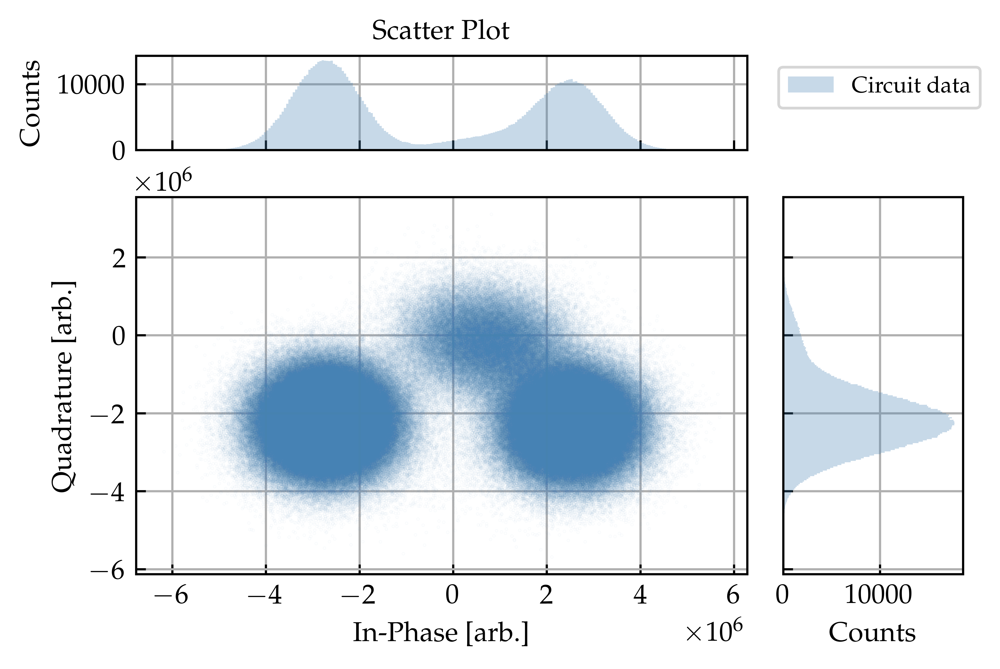

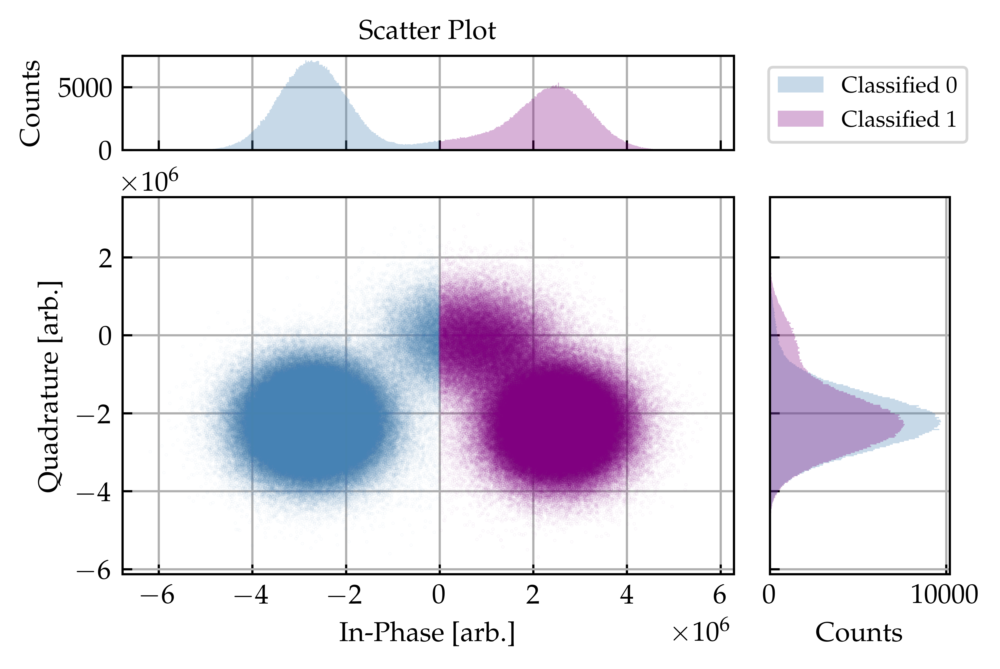

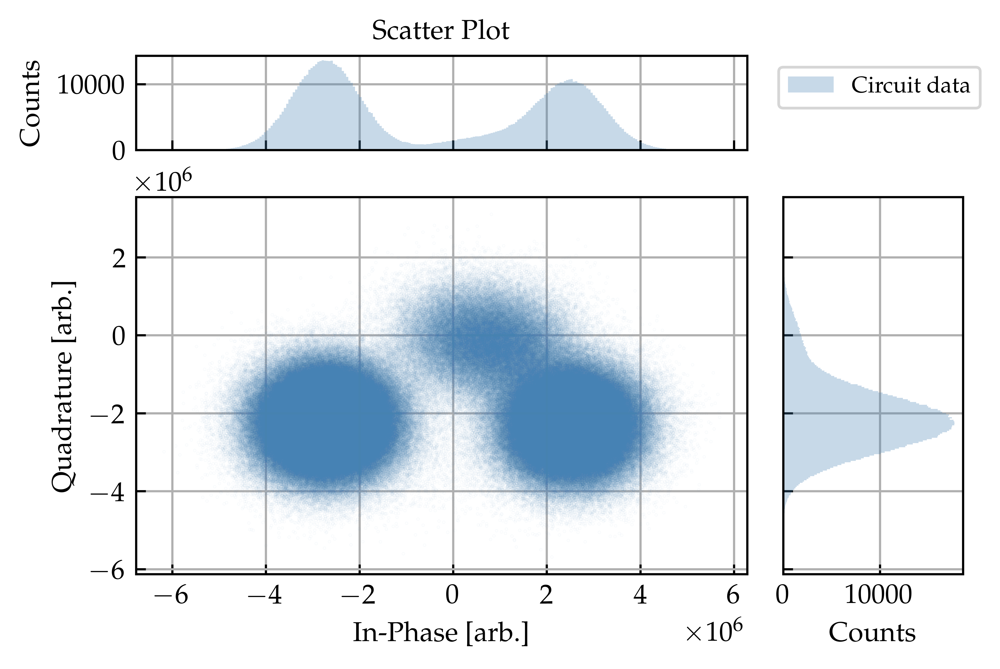

In [52]:
%reload_ext autoreload
%autoreload 2

import numpy as np
from src import cpp_soft_info as csi
from soft_info import plot_IQ_data_pSoft_cmap, save_plot, apply_formatting, plot_double_IQ_scatter, plot_IQ_data, plot_multiple_IQ_data
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pickle

DEVICE = 'ibm_sherbrooke'
ROUNDS = 100
threshold = 0.01


qubit = 3

LOGICAL = '0'
XBASIS = False
file_name = f"../_Thesis_decoding/results/Leakage/Correct_{DEVICE}_{LOGICAL}_{XBASIS}_{ROUNDS}.pkl"
with open(file_name, 'rb') as f:
    (pSofts, countMats, estim0Mats, estim1Mats, inverted_q_maps, big_memories) = pickle.load(f)
n_shots = 10_000
pSoft = np.vstack(pSofts)[:n_shots]
big_memory = np.vstack(big_memories)[:n_shots]
countMat = np.vstack(countMats)[:n_shots]

nBits = 2
pSoft_trunc = csi.quantizeMatrixVectorized(pSoft, nBits)

inverted_q_map = inverted_q_maps[0]
cols = inverted_q_map[qubit]
# fig = plot_IQ_data_pSoft_cmap(big_memory[:, cols], pSoft[:, cols], alpha=0.5, dpi=1000)
# fig = plot_double_IQ_scatter(big_memory[:, cols], pSoft[:, cols], pSoft_trunc[:, cols], nBits=nBits, dpi=500)
# save_plot(fig, f'4_RepetitionCodes/pSoftCmapTrunc_{qubit}_{nBits}_bits.pdf', format='pdf')
plot_multiple_IQ_data([big_memory[:, cols][big_memory[:, cols].real < 0], big_memory[:, cols][big_memory[:, cols].real > 0]], 
                        legend_labels=['Classified 0', 'Classified 1'], dpi = 1000, alpha=0.05)
plot_multiple_IQ_data([big_memory[:, cols]], 
                        legend_labels=['Circuit data'], dpi = 1000, alpha=0.05)

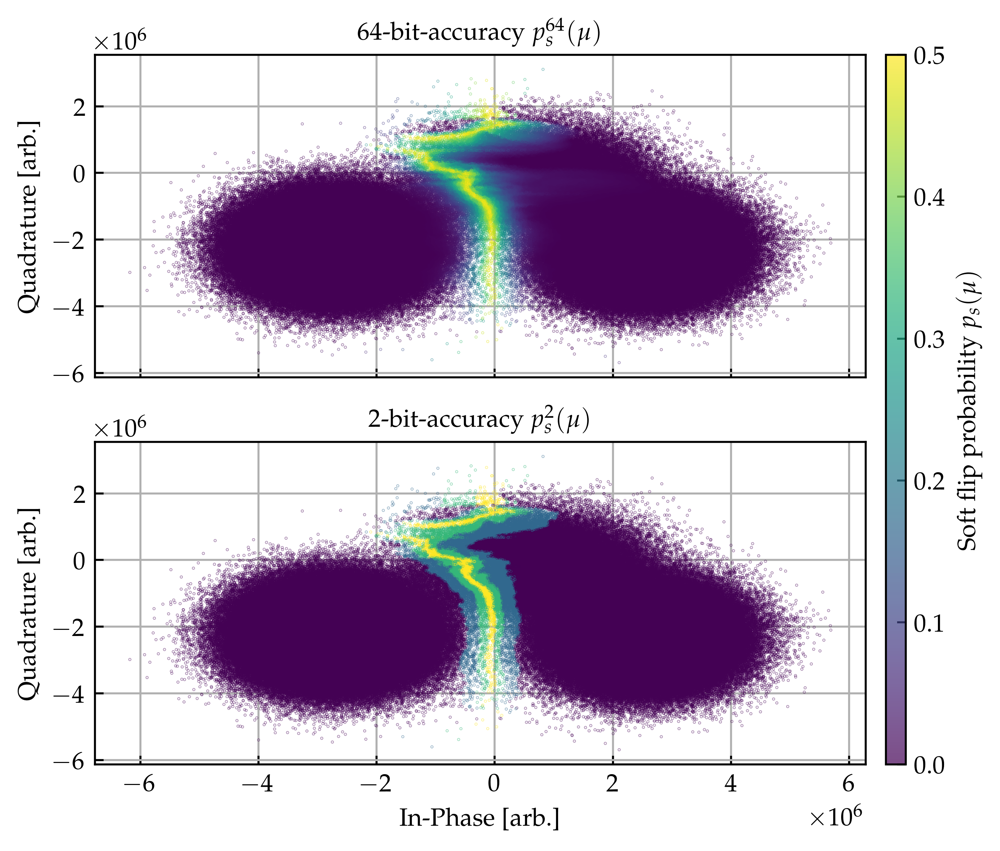

In [1]:
%reload_ext autoreload
%autoreload 2

import numpy as np
from src import cpp_soft_info as csi
from soft_info import plot_IQ_data_pSoft_cmap, save_plot, apply_formatting, plot_double_IQ_scatter, plot_IQ_data, plot_multiple_IQ_data
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pickle

DEVICE = 'ibm_sherbrooke'
ROUNDS = 100
threshold = 0.01


qubit = 3

LOGICAL = '0'
XBASIS = False
file_name = f"../_Thesis_decoding/results/Leakage/Correct_{DEVICE}_{LOGICAL}_{XBASIS}_{ROUNDS}.pkl"
with open(file_name, 'rb') as f:
    (pSofts, countMats, estim0Mats, estim1Mats, inverted_q_maps, big_memories) = pickle.load(f)
n_shots = 10_000
pSoft = np.vstack(pSofts)[:n_shots]
big_memory = np.vstack(big_memories)[:n_shots]
countMat = np.vstack(countMats)[:n_shots]

nBits = 2
pSoft_trunc = csi.quantizeMatrixVectorized(pSoft, nBits)

inverted_q_map = inverted_q_maps[0]
cols = inverted_q_map[qubit]
# fig = plot_IQ_data_pSoft_cmap(big_memory[:, cols], pSoft[:, cols], alpha=0.5, dpi=1000)
fig = plot_double_IQ_scatter(big_memory[:, cols], pSoft[:, cols], pSoft_trunc[:, cols], nBits=nBits, dpi=500)
# save_plot(fig, f'4_RepetitionCodes/pSoftCmapTrunc_{qubit}_{nBits}_bits.pdf', format='pdf')